# Data Description

Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. The task is to create a predictive model that predicts if an insurance claim is fraudulent or not. The dataset has the details of the insurance policy along with the customer details and it also has the details of the accident on the basis of which the claims have been made. We have to now train and build a Machine Learning model to help the Auto Insurance industry with this problem. 



# Importing the Dataset

In [2]:
#Importing Libraries
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

In [3]:
# Importing Dataset
df=pd.read_csv(r'C:\Users\HP-15\Data Trained Projects\Automobile_insurance_fraud.csv')
#Visualizing dataset
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
5,256,39,104594,12-10-2006,OH,250/500,1000,1351.10,0,478456,...,NO,64100,6410,6410,51280,Saab,95,2003,Y,NaN
6,137,34,413978,04-06-2000,IN,250/500,1000,1333.35,0,441716,...,?,78650,21450,7150,50050,Nissan,Pathfinder,2012,N,NaN
7,165,37,429027,03-02-1990,IL,100/300,1000,1137.03,0,603195,...,YES,51590,9380,9380,32830,Audi,A5,2015,N,NaN
8,27,33,485665,05-02-1997,IL,100/300,500,1442.99,0,601734,...,YES,27700,2770,2770,22160,Toyota,Camry,2012,N,NaN
9,212,42,636550,25-07-2011,IL,100/300,500,1315.68,0,600983,...,?,42300,4700,4700,32900,Saab,92x,1996,N,NaN


In the above Dataframe, we can see that we have 1000 rows and 40 columns in total including the output variable. But we are not able to see the entire columns of the dataset, hence we find the datatype of all columns to get the information about data.

We can also note that the data that we have has got some uncertainities. By doing further analysis of data, we will go on solving these uncertainity.

We have a column policy number in out dataset which does not contribute in analysis our data as it the index number of each policy. Hence we will convert this column into an index.

In [4]:
#Displaying maximum rows for better understaning of data
pd.set_option('display.max_rows',None)

In [5]:
#Setting CustomerID as index
df.set_index('policy_number',inplace=True)
df

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
policy_number,,,,,,,,,,,,,,,,,,,,,
521585,328,48,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
342868,228,42,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
687698,134,29,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
227811,256,41,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
367455,228,44,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
104594,256,39,12-10-2006,OH,250/500,1000,1351.10,0,478456,FEMALE,...,NO,64100,6410,6410,51280,Saab,95,2003,Y,NaN
413978,137,34,04-06-2000,IN,250/500,1000,1333.35,0,441716,MALE,...,?,78650,21450,7150,50050,Nissan,Pathfinder,2012,N,NaN
429027,165,37,03-02-1990,IL,100/300,1000,1137.03,0,603195,MALE,...,YES,51590,9380,9380,32830,Audi,A5,2015,N,NaN
485665,27,33,05-02-1997,IL,100/300,500,1442.99,0,601734,FEMALE,...,YES,27700,2770,2770,22160,Toyota,Camry,2012,N,NaN


Column policy number is now acting as an index in our dataset. We also have a column policy_bind_date in the dataframe, we will split this column into policy_bind_day, policy_bind_month & policy_bind_year 

In [6]:
#Checking datatype of each column
df.dtypes

months_as_customer               int64
age                              int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day         int64
number_of_vehicles_involv

As we see that the date column has string data type, hence we convert it into datetime datatye.

In [7]:
#Converting date column from string to datetime stamp
df['policy_bind_date'] = pd.to_datetime(df['policy_bind_date'])

In [150]:
#verifying the datatype of date_of_journey column
df.dtypes

months_as_customer                      int64
age                                     int64
policy_bind_date               datetime64[ns]
policy_state                           object
policy_csl                             object
policy_deductable                       int64
policy_annual_premium                 float64
umbrella_limit                          int64
insured_zip                             int64
insured_sex                            object
insured_education_level                object
insured_occupation                     object
insured_hobbies                        object
insured_relationship                   object
capital-gains                           int64
capital-loss                            int64
incident_date                          object
incident_type                          object
collision_type                         object
incident_severity                      object
authorities_contacted                  object
incident_state                    

The policy_bind_date column is now converted into datetime datatype. We will now split this column into Day, Month and Year to improve performance.

In [8]:
#Splitting of day, month nad Year from the Date_Of_Journey column
df['policy_bind_day']= df['policy_bind_date'].dt.year
df['policy_bind_month']= df['policy_bind_date'].dt.month
df['policy_bind_year']= df['policy_bind_date'].dt.day

In [9]:
#Verifying the columns
df.head()

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,...,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39,policy_bind_day,policy_bind_month,policy_bind_year
policy_number,,,,,,,,,,,,,,,,,,,,,
521585,328,48,2014-10-17,OH,250/500,1000,1406.91,0,466132,MALE,...,13020,52080,Saab,92x,2004,Y,NaN,2014,10,17
342868,228,42,2006-06-27,IN,250/500,2000,1197.22,5000000,468176,MALE,...,780,3510,Mercedes,E400,2007,Y,NaN,2006,6,27
687698,134,29,2000-06-09,OH,100/300,2000,1413.14,5000000,430632,FEMALE,...,3850,23100,Dodge,RAM,2007,N,NaN,2000,6,9
227811,256,41,1990-05-25,IL,250/500,2000,1415.74,6000000,608117,FEMALE,...,6340,50720,Chevrolet,Tahoe,2014,Y,NaN,1990,5,25
367455,228,44,2014-06-06,IL,500/1000,1000,1583.91,6000000,610706,MALE,...,650,4550,Accura,RSX,2009,N,NaN,2014,6,6


As we have retrieved the data from date column by splitting it, so we will drop the policy_bind_date column.

In [10]:
#Dropping column
df.drop('policy_bind_date',axis=1,inplace=True)

In [11]:
#Verifying the columns
df.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,...,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39,policy_bind_day,policy_bind_month,policy_bind_year
policy_number,,,,,,,,,,,,,,,,,,,,,
521585,328,48,OH,250/500,1000,1406.91,0,466132,MALE,MD,...,13020,52080,Saab,92x,2004,Y,NaN,2014,10,17
342868,228,42,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,...,780,3510,Mercedes,E400,2007,Y,NaN,2006,6,27
687698,134,29,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,...,3850,23100,Dodge,RAM,2007,N,NaN,2000,6,9
227811,256,41,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,...,6340,50720,Chevrolet,Tahoe,2014,Y,NaN,1990,5,25
367455,228,44,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,...,650,4550,Accura,RSX,2009,N,NaN,2014,6,6


We cannot see the date column in our dataset.

# Checking Null Values

In [12]:
#Checking Null values
df.isnull().sum()

months_as_customer                0
age                               0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage                   0
bodily_injuries                   0
witnesses                   

We can observe that the column _c39 has all null values, hence we drop the column.

In [13]:
#Dropping column
df.drop('_c39',axis=1,inplace=True)

In [16]:
#Verifying the columns
df

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,...,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_day,policy_bind_month,policy_bind_year
policy_number,,,,,,,,,,,,,,,,,,,,,
521585,328,48,OH,250/500,1000,1406.91,0,466132,MALE,MD,...,6510,13020,52080,Saab,92x,2004,Y,2014,10,17
342868,228,42,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,...,780,780,3510,Mercedes,E400,2007,Y,2006,6,27
687698,134,29,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,...,7700,3850,23100,Dodge,RAM,2007,N,2000,6,9
227811,256,41,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,...,6340,6340,50720,Chevrolet,Tahoe,2014,Y,1990,5,25
367455,228,44,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,...,1300,650,4550,Accura,RSX,2009,N,2014,6,6
104594,256,39,OH,250/500,1000,1351.10,0,478456,FEMALE,PhD,...,6410,6410,51280,Saab,95,2003,Y,2006,12,10
413978,137,34,IN,250/500,1000,1333.35,0,441716,MALE,PhD,...,21450,7150,50050,Nissan,Pathfinder,2012,N,2000,4,6
429027,165,37,IL,100/300,1000,1137.03,0,603195,MALE,Associate,...,9380,9380,32830,Audi,A5,2015,N,1990,3,2
485665,27,33,IL,100/300,500,1442.99,0,601734,FEMALE,PhD,...,2770,2770,22160,Toyota,Camry,2012,N,1997,5,2


The dataset is not showing any null values but we can see "?" mark values in our dataset. We will first deal with these values.

In [17]:
#Replacing "?" values in the dataset with NaN values
df=df.replace("?",np.NaN)

In [18]:
#Verifying Null Values
df.isnull().sum()

months_as_customer               0
age                              0
policy_state                     0
policy_csl                       0
policy_deductable                0
policy_annual_premium            0
umbrella_limit                   0
insured_zip                      0
insured_sex                      0
insured_education_level          0
insured_occupation               0
insured_hobbies                  0
insured_relationship             0
capital-gains                    0
capital-loss                     0
incident_date                    0
incident_type                    0
collision_type                 178
incident_severity                0
authorities_contacted            0
incident_state                   0
incident_city                    0
incident_location                0
incident_hour_of_the_day         0
number_of_vehicles_involved      0
property_damage                360
bodily_injuries                  0
witnesses                        0
police_report_availa

We can now observe null values in columns collision_type, property_damage & police_report_available. We will first check the datatype of these variables before applying any Imputer functions.

In [19]:
#CHecking datatypes of columns having null values
df.dtypes

months_as_customer               int64
age                              int64
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day         int64
number_of_vehicles_involved      int64
property_damage          

Columns collision_type, property_damage & police_report_available are in string datatype. Hence, we will use Simple Imputer function with "most_frequent" strategy to resolve these Null Values.

In [20]:
#Filling the NaN values using simle Imputer
from sklearn.impute import SimpleImputer

imp=SimpleImputer(strategy='most_frequent')

df['collision_type']=imp.fit_transform(df['collision_type'].values.reshape(-1,1))
df['property_damage']=imp.fit_transform(df['property_damage'].values.reshape(-1,1))
df['police_report_available']=imp.fit_transform(df['police_report_available'].values.reshape(-1,1))


df.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,...,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_day,policy_bind_month,policy_bind_year
policy_number,,,,,,,,,,,,,,,,,,,,,
521585,328,48,OH,250/500,1000,1406.91,0,466132,MALE,MD,...,6510,13020,52080,Saab,92x,2004,Y,2014,10,17
342868,228,42,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,...,780,780,3510,Mercedes,E400,2007,Y,2006,6,27
687698,134,29,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,...,7700,3850,23100,Dodge,RAM,2007,N,2000,6,9
227811,256,41,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,...,6340,6340,50720,Chevrolet,Tahoe,2014,Y,1990,5,25
367455,228,44,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,...,1300,650,4550,Accura,RSX,2009,N,2014,6,6


In [21]:
#Verifying null values again
df.isnull().sum()

months_as_customer             0
age                            0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_claim_amount             0
injury_cla

In [22]:
#Visualizing null values through heatmap
import seaborn as sns
sns.heatmap(df.isnull())

As we cannot see any null values in our data. Hence, we proceed forward with Visualizing the data.

# Making DataFrame for the String Values Data

In [24]:
#Copying nominal variables into a new dataframe
df_nominal=df[['policy_state','policy_csl','insured_sex','insured_education_level','insured_occupation','insured_hobbies','insured_relationship','incident_date','incident_type','collision_type','incident_severity','authorities_contacted','incident_state','incident_city','incident_location','property_damage','police_report_available','auto_make','auto_model','fraud_reported']].copy()

In [25]:
#Checking columns of new nominal dataframe created
df_nominal.columns

Index(['policy_state', 'policy_csl', 'insured_sex', 'insured_education_level',
       'insured_occupation', 'insured_hobbies', 'insured_relationship',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'property_damage', 'police_report_available',
       'auto_make', 'auto_model', 'fraud_reported'],
      dtype='object')

In [26]:
#Cheking shape of new nominal dataframe
df_nominal.shape

(1000, 20)

We have 20 columns in the nominal DataFrame.

# Visualization of Data

For the string data we will use countplot as it will gives frequency of the columns.

In [27]:
#Importing Libraries for Visualization
import seaborn as sns
import matplotlib.pyplot as plt

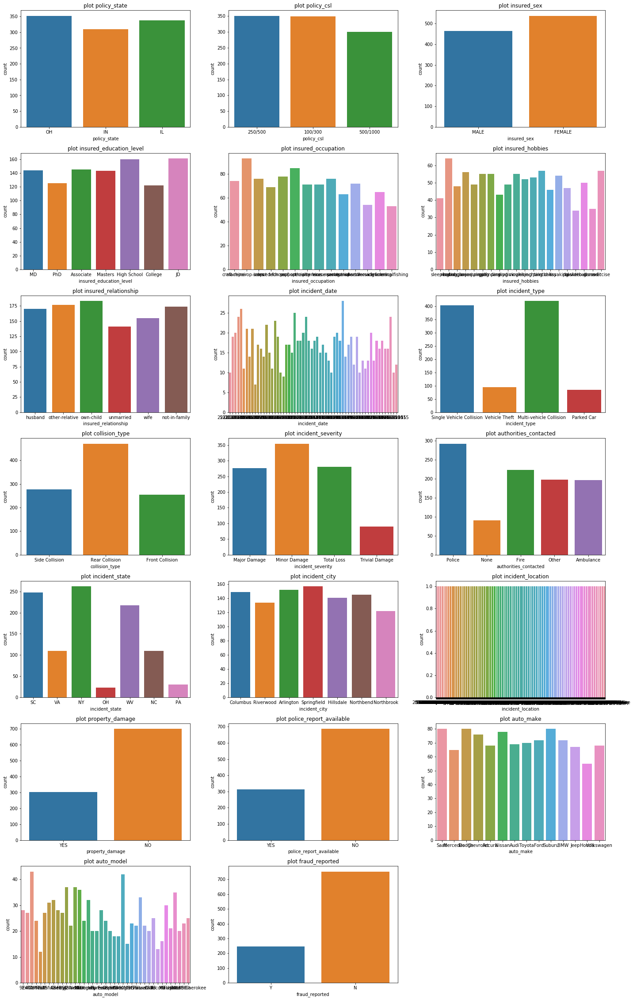

In [168]:
#Visualizing different columns using countplot
ncol,nrow=9,3
ab=df_nominal.columns.values
plt.figure(figsize=(20,40))
for index,i in enumerate(ab):
    ab=plt.subplot(ncol,nrow,index+1)
    sns.countplot(df[i])
    plt.title(f"plot {i}")
    plt.tight_layout()
plt.show()

# Observation:
    
There are more Female customers than the male customers.

More than 700 people have been reported with No Fraud but around 250 People have been reported with Fraud.

300 customer's property has been damaged and 700 customer's property has not been damaged.

Around 320 customer's police report is available and 680 customer's police report is not available.

Incident is high in states SC, NY and WV.

Rear Collision is the max collision type.

The incident severity is Minor damage in most of the cases.

Police authorities have been contacted the most.

There are too many categories in columns like auto_model, auto_make, incident_location, incident_date, insured_occupation & insured_hobies. Hence, it is difficult to conclude any observation out of these columns. We will try understanding these data using different visualization techniques.

# Making DataFrame of the Int/Float type of Values

In [28]:
#Copying our continuous data into a new dataframe
df_continuous=df[['months_as_customer', 'age','policy_deductable','policy_annual_premium', 'umbrella_limit','insured_zip','capital-gains', 'capital-loss','incident_hour_of_the_day', 'number_of_vehicles_involved','bodily_injuries','witnesses', 'total_claim_amount', 'injury_claim','property_claim', 'vehicle_claim','auto_year','policy_bind_day', 'policy_bind_month','policy_bind_year']].copy()

In [29]:
#Checking columns of new continuous dataframe created
df_continuous.columns

Index(['months_as_customer', 'age', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip',
       'capital-gains', 'capital-loss', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'bodily_injuries', 'witnesses',
       'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim',
       'auto_year', 'policy_bind_day', 'policy_bind_month',
       'policy_bind_year'],
      dtype='object')

In [30]:
#Checking shape of nominal data
df_continuous.shape

(1000, 20)

The continuous data consists of 20 columns.

# Visualizing Int/Float Data


For the Int/Float type of data we will use distplot as it will give us the frequency of the values.

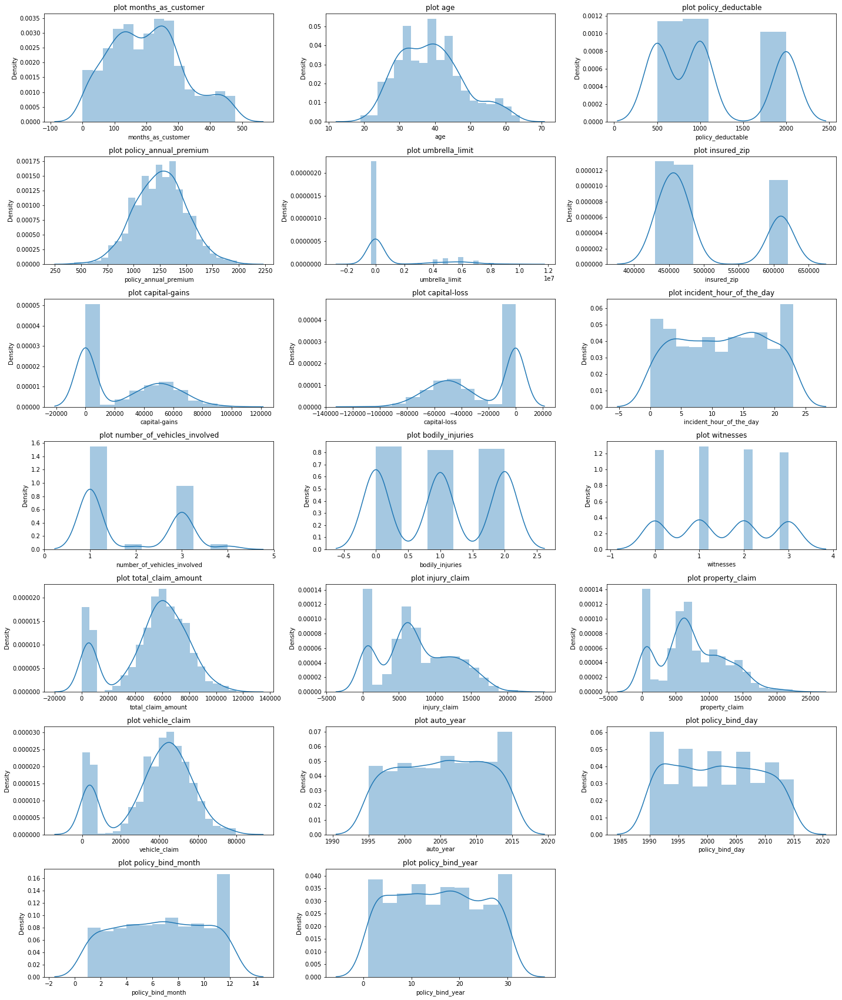

In [32]:
#Visualizing different columns using distplot
ncol,nrow=9,3
ab=df_continuous.columns.values
plt.figure(figsize=(20,30))
for index,i in enumerate(ab):
    ab=plt.subplot(ncol,nrow,index+1)
    sns.distplot(df[i])
    plt.title(f"plot {i}")
    plt.tight_layout()
plt.show()

Observations:
    
Columns policy_bind_year, policy_bind_month, policy_bind_day, auto_ year & incident_hour_of_the_day are showing values at a constant rate.

Column capital-gains shows a right tail skewed data.

Column capital-loss shows a left tail skewed data.

Column umbrella_limit consists of maximum number of 0 values.

We can also observe negative values in capital loss column.

Capital-gains consists of values ranging till positive 120000.

Capital-losss consists of values ranging till negative 130000.

Columns like number_of_vehicles_involved, bodily_injuries & witnesses have a nominal/categorical type of data.

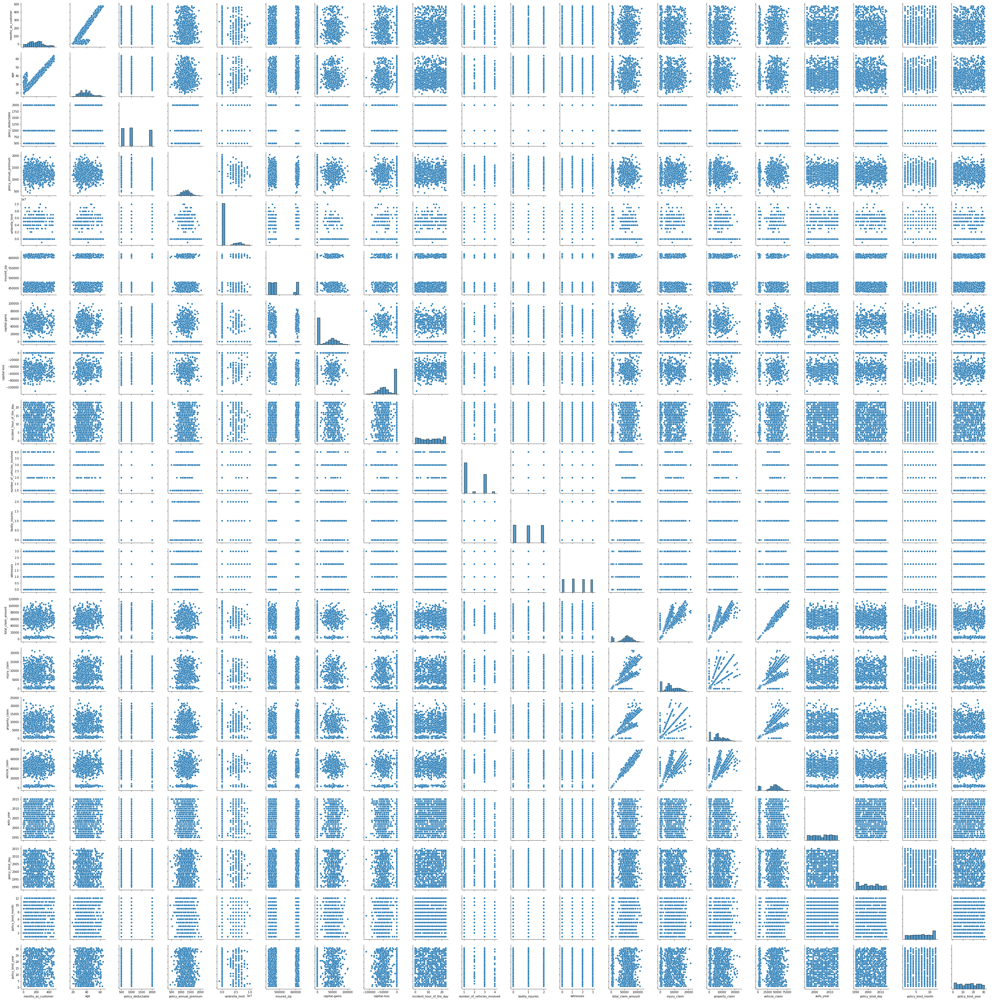

In [33]:
#Using multivariate analysis to analyze data
sns.pairplot(df)

Observations:
    
We can observe few positive correlations between the input features of the data.

We do not see any negative correlations between any variables within our whole dataset.

We are not able to see any relationship of the input variables with our target variable i.e. positive/negative correlations. Hence, we will use different visualization techniques to find correlations between the variables.

As most of the data in our dataset is of the object datatype so we are unable to understand the data using this analysis. 

We are unable to identify any relationship between the columns in the above pairplot due to huge number of columns. 

# Encoding of DataFrame

In [34]:
#Importing library for encoding and creating instance for the same 
from sklearn.preprocessing import OrdinalEncoder
enc=OrdinalEncoder()

In [35]:
#Converting object datatype into float values
for i in df.columns:
    if df[i].dtypes=='object':
        df[i]=enc.fit_transform(df[i].values.reshape(-1,1))

In [36]:
#Verifying Conversion 
df.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,...,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_day,policy_bind_month,policy_bind_year
policy_number,,,,,,,,,,,,,,,,,,,,,
521585,328,48,2.0,1.0,1000,1406.91,0,466132,1.0,4.0,...,6510,13020,52080,10.0,1.0,2004,1.0,2014,10,17
342868,228,42,1.0,1.0,2000,1197.22,5000000,468176,1.0,4.0,...,780,780,3510,8.0,12.0,2007,1.0,2006,6,27
687698,134,29,2.0,0.0,2000,1413.14,5000000,430632,0.0,6.0,...,7700,3850,23100,4.0,30.0,2007,0.0,2000,6,9
227811,256,41,0.0,1.0,2000,1415.74,6000000,608117,0.0,6.0,...,6340,6340,50720,3.0,34.0,2014,1.0,1990,5,25
367455,228,44,0.0,2.0,1000,1583.91,6000000,610706,1.0,0.0,...,1300,650,4550,0.0,31.0,2009,0.0,2014,6,6


We can observe that our object datatype has been now converted into float values.

# Describe Data

In [37]:
#Describing final columns present in dataset
df.columns

Index(['months_as_customer', 'age', 'policy_state', 'policy_csl',
       'policy_deductable', 'policy_annual_premium', 'umbrella_limit',
       'insured_zip', 'insured_sex', 'insured_education_level',
       'insured_occupation', 'insured_hobbies', 'insured_relationship',
       'capital-gains', 'capital-loss', 'incident_date', 'incident_type',
       'collision_type', 'incident_severity', 'authorities_contacted',
       'incident_state', 'incident_city', 'incident_location',
       'incident_hour_of_the_day', 'number_of_vehicles_involved',
       'property_damage', 'bodily_injuries', 'witnesses',
       'police_report_available', 'total_claim_amount', 'injury_claim',
       'property_claim', 'vehicle_claim', 'auto_make', 'auto_model',
       'auto_year', 'fraud_reported', 'policy_bind_day', 'policy_bind_month',
       'policy_bind_year'],
      dtype='object')

In [38]:
#Defining Shape
df.shape

(1000, 40)

We finally now have 40 columns in our dataset.

In [39]:
#Getting data information
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000 entries, 521585 to 556080
Data columns (total 40 columns):
months_as_customer             1000 non-null int64
age                            1000 non-null int64
policy_state                   1000 non-null float64
policy_csl                     1000 non-null float64
policy_deductable              1000 non-null int64
policy_annual_premium          1000 non-null float64
umbrella_limit                 1000 non-null int64
insured_zip                    1000 non-null int64
insured_sex                    1000 non-null float64
insured_education_level        1000 non-null float64
insured_occupation             1000 non-null float64
insured_hobbies                1000 non-null float64
insured_relationship           1000 non-null float64
capital-gains                  1000 non-null int64
capital-loss                   1000 non-null int64
incident_date                  1000 non-null float64
incident_type                  1000 non-null float64

There are 1000 rows and no null values in our data. Also the values in the dataset are in the form of float and int. Now, we can try understanding our data better.

In [40]:
#Describing mean, median, min, max values of data
df.describe()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,...,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_day,policy_bind_month,policy_bind_year
count,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,...,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,1.01400,0.951000,1136.000000,1256.406150,1.101000e+06,501214.488000,0.463000,2.966000,...,7433.420000,7399.570000,37928.950000,6.546000,19.318000,2005.103000,0.247000,2001.604000,6.559000,15.448000
std,115.113174,9.140287,0.83096,0.804516,611.864673,244.167395,2.297407e+06,71701.610941,0.498879,1.948497,...,4880.951853,4824.726179,18886.252893,4.034869,11.136107,6.015861,0.431483,7.360391,3.391758,8.850176
min,0.000000,19.000000,0.00000,0.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,0.000000,...,0.000000,0.000000,70.000000,0.000000,0.000000,1995.000000,0.000000,1990.000000,1.000000,1.000000
25%,115.750000,32.000000,0.00000,0.000000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,1.000000,...,4295.000000,4445.000000,30292.500000,3.000000,10.000000,2000.000000,0.000000,1995.000000,4.000000,8.000000
50%,199.500000,38.000000,1.00000,1.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,3.000000,...,6775.000000,6750.000000,42100.000000,7.000000,20.000000,2005.000000,0.000000,2002.000000,7.000000,16.000000
75%,276.250000,44.000000,2.00000,2.000000,2000.000000,1415.695000,0.000000e+00,603251.000000,1.000000,5.000000,...,11305.000000,10885.000000,50822.500000,10.000000,29.000000,2010.000000,0.000000,2008.000000,9.000000,23.000000
max,479.000000,64.000000,2.00000,2.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,1.000000,6.000000,...,21450.000000,23670.000000,79560.000000,13.000000,38.000000,2015.000000,1.000000,2015.000000,12.000000,31.000000


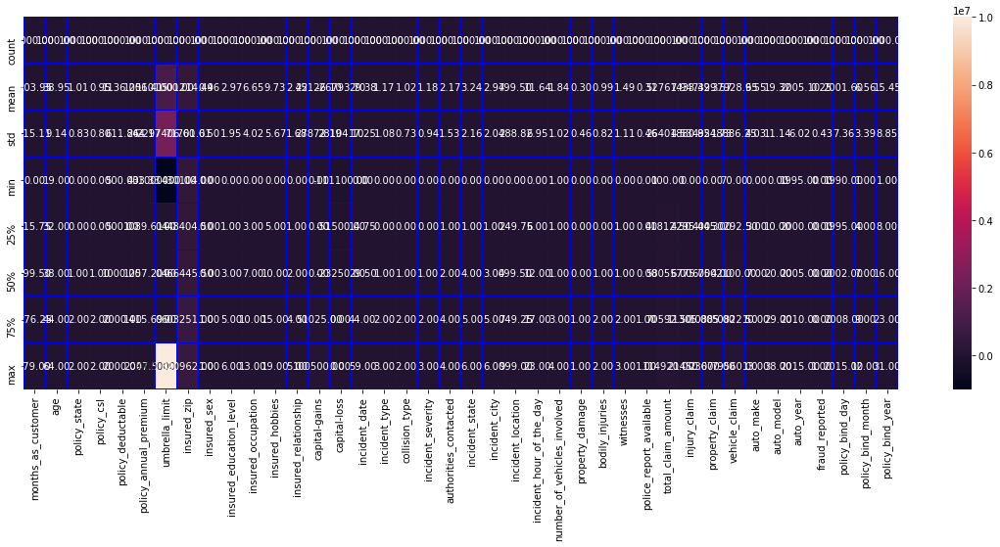

In [181]:
#Visualizing data description
import matplotlib.pyplot as plt
plt.figure(figsize=(20,7))
sns.heatmap(df.describe(),annot=True,linewidths=0.1,linecolor='blue',fmt='0.2f')

Obervations:
    
The standard deviation of the columns in our dataset is very huge which means that the values in these columns are largely scattered and are not near to the mean values. They are very far away from their mean values.

The values inside our dataset ranges from high negative values to high positive values. The data range is very high within the dataset.

The min & max values in every column has huge range difference.

We are unable to understand data properly due to huge number of columns. Hence, we will try to find correlations between variables with the help of heatmap. But we can observe that the data is widely scattered.

# Correlation of Columns with the Target Variable

In [41]:
df.corr()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,...,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_day,policy_bind_month,policy_bind_year
months_as_customer,1.000000,0.922098,-0.000328,-0.026819,0.026807,0.005018,0.015498,0.017895,0.060925,-0.000833,...,0.065329,0.034940,0.061013,0.047655,0.004202,-0.000292,0.020544,-0.048276,0.005750,0.051728
age,0.922098,1.000000,-0.014533,-0.015185,0.029188,0.014404,0.018126,0.025604,0.073337,0.000969,...,0.075522,0.060898,0.062588,0.030410,0.017343,0.001354,0.012143,-0.037444,0.015501,0.053869
policy_state,-0.000328,-0.014533,1.000000,0.001027,0.010033,0.012455,-0.029580,0.008777,-0.020481,-0.034327,...,-0.046290,0.008406,0.001425,0.017124,-0.025253,0.002114,0.029432,-0.007276,0.071450,0.002277
policy_csl,-0.026819,-0.015185,0.001027,1.000000,0.003384,0.023978,0.021636,0.006879,-0.010757,0.009153,...,-0.078818,-0.042216,-0.046791,-0.004701,0.047885,-0.033082,-0.037190,-0.016466,-0.045345,0.018973
policy_deductable,0.026807,0.029188,0.010033,0.003384,1.000000,-0.003245,0.010870,0.004545,-0.009733,0.015217,...,0.039107,0.064792,0.005269,-0.035379,-0.003268,0.026105,0.014817,-0.049598,-0.050416,0.009164
policy_annual_premium,0.005018,0.014404,0.012455,0.023978,-0.003245,1.000000,-0.006247,0.032354,0.038853,-0.019715,...,-0.017633,-0.011654,0.020246,0.000045,-0.031849,-0.049226,-0.014480,0.001249,-0.035355,-0.025183
umbrella_limit,0.015498,0.018126,-0.029580,0.021636,0.010870,-0.006247,1.000000,0.019671,0.010688,-0.019357,...,-0.045412,-0.023790,-0.038584,-0.004443,0.040256,0.009893,0.058622,0.048008,0.009961,-0.045207
insured_zip,0.017895,0.025604,0.008777,0.006879,0.004545,0.032354,0.019671,1.000000,-0.036942,0.016079,...,-0.017495,-0.006841,-0.041083,-0.020892,0.023637,-0.032736,0.019368,-0.001100,0.015864,-0.039867
insured_sex,0.060925,0.073337,-0.020481,-0.010757,-0.009733,0.038853,0.010688,-0.036942,1.000000,0.009002,...,0.000924,-0.014868,-0.029609,0.026457,-0.018421,-0.028247,0.030873,-0.032891,-0.004033,0.040713
insured_education_level,-0.000833,0.000969,-0.034327,0.009153,0.015217,-0.019715,-0.019357,0.016079,0.009002,1.000000,...,0.081880,0.055794,0.068348,0.055202,0.049445,0.043509,0.008808,0.018952,-0.007118,0.012610


We can notice both positive and negative correlations between variables within the dataset.

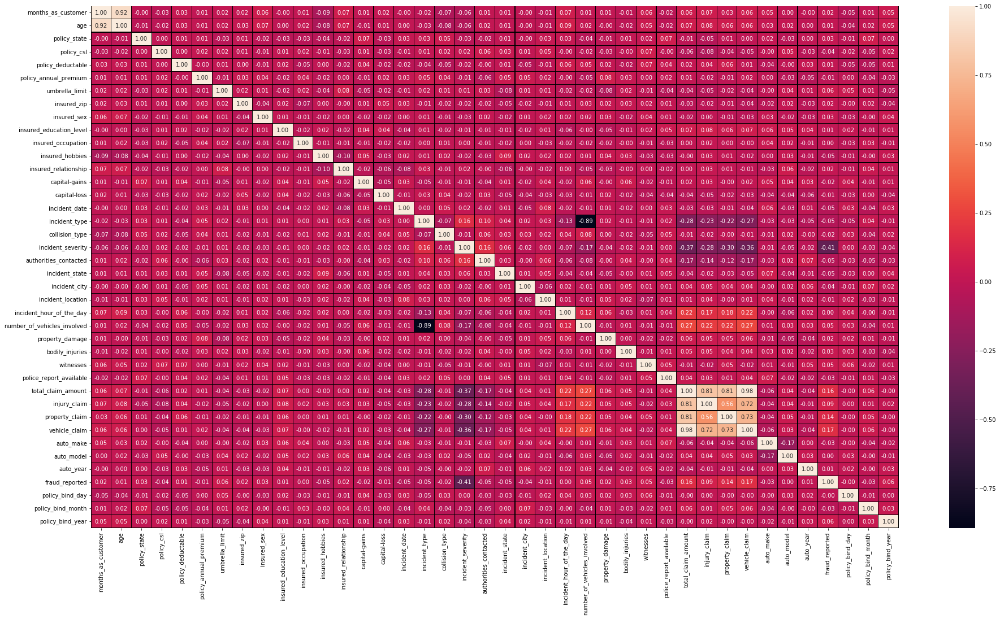

In [42]:
#Plotting correlation of input features with the target Variable
plt.figure(figsize=(32,17))
sns.heatmap(df.corr(),annot=True,linewidths=0.1,linecolor='black',fmt='0.2f')

Observations:
    
The most negatively correlated column to the target variable is incident_severity.

The most positively correlated column to the target variable is vehicle_claim.

We dont see any high positive correlation in our data with respect to the target variable.


In [43]:
#Sorting correlation in order with the Target Variable
corr_matrix=df.corr()
corr_matrix['fraud_reported'].sort_values(ascending=False)

fraud_reported                 1.000000
vehicle_claim                  0.170049
total_claim_amount             0.163651
property_claim                 0.137835
injury_claim                   0.090975
policy_bind_year               0.060643
umbrella_limit                 0.058622
number_of_vehicles_involved    0.051839
witnesses                      0.049497
bodily_injuries                0.033877
insured_sex                    0.030873
policy_state                   0.029432
insured_relationship           0.021043
months_as_customer             0.020544
insured_zip                    0.019368
property_damage                0.017202
policy_deductable              0.014817
age                            0.012143
insured_education_level        0.008808
auto_year                      0.007928
incident_hour_of_the_day       0.004316
insured_occupation             0.001564
auto_model                     0.000720
policy_bind_day               -0.000059
incident_location             -0.008832


There are 22 columns which are positively correlated with the Target Variable.

There are 17 columns which are negatively correlated with the Target Variable.

Hence, there are more positive correlations than negative correlations.


# Checking Skewness

In [44]:
#Checking Skewness
df.skew()

months_as_customer             0.362177
age                            0.478988
policy_state                  -0.026177
policy_csl                     0.088928
policy_deductable              0.477887
policy_annual_premium          0.004402
umbrella_limit                 1.806712
insured_zip                    0.816554
insured_sex                    0.148630
insured_education_level       -0.000148
insured_occupation            -0.058881
insured_hobbies               -0.061563
insured_relationship           0.077488
capital-gains                  0.478850
capital-loss                  -0.391472
incident_date                  0.004756
incident_type                  0.101507
collision_type                -0.033682
incident_severity              0.279016
authorities_contacted         -0.121744
incident_state                -0.148865
incident_city                  0.049531
incident_location              0.000000
incident_hour_of_the_day      -0.035584
number_of_vehicles_involved    0.502664


Keeping threshold +/-0.5 as the range for skewness, we can see skewness in columns umbrella_limit, insured_zip, property_damage, police_report_available, total_claim_amount, vehicle_claim & fraud_reported.

Columns umbrella_limit, insured_zip, total_claim_amount & vehicle_claim are all integer values. Hence, we will check outliers present in our data and try to resolve the skewness in data.

Columns property_damage & police_report_available are of string datatype and column fraud_reported is the Target Variable. Hence, we don't consider the skewness present in these columns.

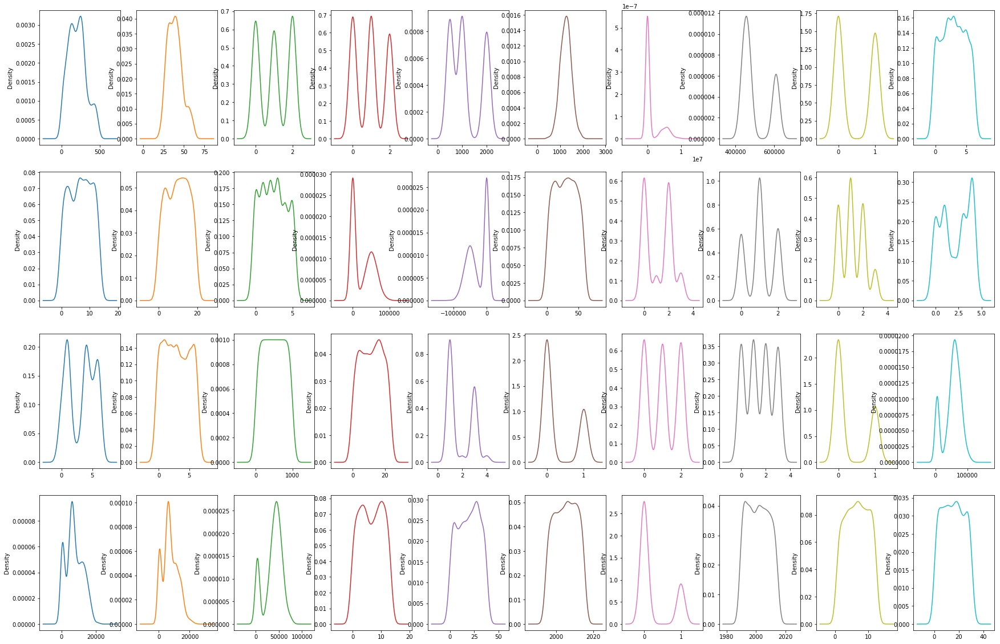

In [45]:
#Visualizing skewness on density graph
#Example of multi variate analysis
df.plot(kind='density',subplots=True,layout=(4,10),legend=False,sharex=False,figsize=(30,20))
plt.show()

We can see that our data is not showing much skewness from the above graph. Hence, we will now check outliers.

# Checking Outliers

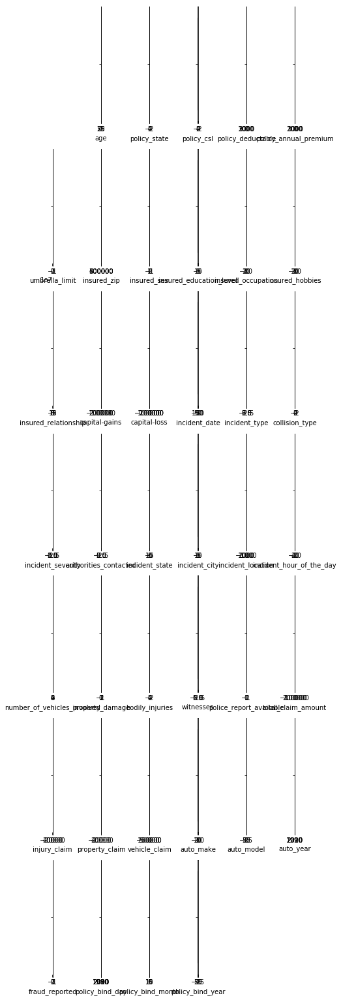

In [46]:
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
#Visualizing outliers of different variables
collist=df.columns.values
ncol=6
nrows=10
plt.figure(figsize=(ncol,5*ncol))
for i in range(1,len(collist)):
    plt.subplot(nrows,ncol,i+1)
    sns.boxplot(df[collist[i]],color='orange',orient='v')
    plt.tight_layout()

We can observe maximum outliers in column umbrella_limit and a few outliers in 2/3 more columns. We will try to resolve these outliers for better performance of the model.

# Resolving Outliers

In [47]:
#removing outliers
from scipy.stats import zscore 
z=np.abs(zscore(df))
z

array([[1.07813958, 0.99083647, 1.18717314, ..., 1.68499231, 1.01502574,
        0.17545148],
       [0.2089946 , 0.33407345, 0.01685641, ..., 0.59754971, 0.16489375,
        1.30593786],
       [0.60800168, 1.08891308, 1.18717314, ..., 0.21803224, 0.16489375,
        0.72893761],
       ...,
       [0.64276748, 0.54161057, 1.18717314, ..., 0.18975873, 1.34481324,
        0.17545148],
       [2.20802805, 2.52328351, 1.22088596, ..., 1.27720133, 1.31000562,
        0.28850012],
       [2.19064515, 2.3043625 , 1.18717314, ..., 0.76175354, 1.31000562,
        0.50284034]])

In [49]:
#Setting threshold values to remove outliers
threshold=3
print(np.where(z>3))

(array([ 31,  48,  88, 115, 119, 229, 248, 262, 314, 430, 458, 500, 503,
       657, 700, 763, 807, 875, 922, 975], dtype=int64), array([ 6,  6,  6,  6,  6,  5,  5,  6,  6,  6,  6, 31,  6,  6,  6,  5, 14,
        6,  6,  6], dtype=int64))


In [50]:
#Removing all values more than 3(threshold value)
df_new=df[(z<3).all(axis=1)]
df_new

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,...,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_day,policy_bind_month,policy_bind_year
policy_number,,,,,,,,,,,,,,,,,,,,,
521585,328,48,2.0,1.0,1000,1406.91,0,466132,1.0,4.0,...,6510,13020,52080,10.0,1.0,2004,1.0,2014,10,17
342868,228,42,1.0,1.0,2000,1197.22,5000000,468176,1.0,4.0,...,780,780,3510,8.0,12.0,2007,1.0,2006,6,27
687698,134,29,2.0,0.0,2000,1413.14,5000000,430632,0.0,6.0,...,7700,3850,23100,4.0,30.0,2007,0.0,2000,6,9
227811,256,41,0.0,1.0,2000,1415.74,6000000,608117,0.0,6.0,...,6340,6340,50720,3.0,34.0,2014,1.0,1990,5,25
367455,228,44,0.0,2.0,1000,1583.91,6000000,610706,1.0,0.0,...,1300,650,4550,0.0,31.0,2009,0.0,2014,6,6
104594,256,39,2.0,1.0,1000,1351.10,0,478456,0.0,6.0,...,6410,6410,51280,10.0,3.0,2003,1.0,2006,12,10
413978,137,34,1.0,1.0,1000,1333.35,0,441716,1.0,6.0,...,21450,7150,50050,9.0,29.0,2012,0.0,2000,4,6
429027,165,37,0.0,0.0,1000,1137.03,0,603195,1.0,0.0,...,9380,9380,32830,1.0,5.0,2015,0.0,1990,3,2
485665,27,33,0.0,0.0,500,1442.99,0,601734,0.0,6.0,...,2770,2770,22160,12.0,9.0,2012,0.0,1997,5,2


# Calculating Data Loss

In [51]:
#Checking shape before removing outliers
df.shape

(1000, 40)

In [52]:
#Checking shape after removing outliers
df_new.shape

(980, 40)

In [55]:
#Using formula to calculate data loss
data_loss=((1000-980)/1000)*100

In [56]:
data_loss

2.0

The data lost is 2% which is not a huge data loss. Hence, we can proceed.

# Separating the column into x & y

In [57]:
#Creating x & y columns 
x=df_new.drop('fraud_reported',axis=1)
y=df_new['fraud_reported']

Separating the columns into x & y as input featues and target variable respectively.

# Scaling Data Using Standard Scaler


In [58]:
#importing library for scaling
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings('ignore')

In [59]:
#Scaling our data to improve model performance
sc=StandardScaler()
x=sc.fit_transform(df_new)
x

array([[ 1.06956809,  0.98335151,  1.17982066, ...,  1.68315746,
         1.01347275,  0.1746925 ],
       [ 0.20272605,  0.32971067, -0.0245796 , ...,  0.6002792 ,
        -0.16261167,  1.30845842],
       [-0.61210547, -1.08651116,  1.17982066, ..., -0.2118795 ,
        -0.16261167, -0.73232023],
       ...,
       [-0.64677915, -0.54181045,  1.17982066, ...,  0.19419985,
        -1.3386961 ,  0.1746925 ],
       [ 2.19646275,  2.50851348, -1.22897986, ...,  1.27707811,
         1.30749386,  0.28806909],
       [ 2.17912591,  2.2906332 ,  1.17982066, ..., -0.75331862,
         1.30749386, -0.50556705]])

Hence, the data is Scaled.

Since our Target Variable has binary values, we use Classification Algorithms. Since, we have many columns in our dataset, we will try to remove columns with less importance and only use the important information. For doing this, we will apply PCA on our data.

# Applying PCA on Data


In [60]:
#importing libraries and creating object for PCA
from sklearn.decomposition import PCA
pca=PCA()
Y=pca.fit(x)

In [61]:
#Getting optimum number automatically calculated for huge data
var_cumu=np.cumsum(Y.explained_variance_ratio_)*100
var_cumu

array([ 10.00285601,  15.00619404,  19.27419355,  22.81342189,
        26.06089032,  29.271597  ,  32.31660171,  35.33676765,
        38.34462544,  41.25021289,  44.14838481,  47.00071197,
        49.79468789,  52.49776557,  55.1627527 ,  57.77178357,
        60.31702817,  62.81101911,  65.28547168,  67.70293897,
        70.09673609,  72.44661693,  74.71892746,  76.9570563 ,
        79.13403143,  81.29836516,  83.36974685,  85.43261785,
        87.40882433,  89.33379379,  91.23323848,  93.0880023 ,
        94.90819798,  96.65956166,  97.96309518,  98.99281676,
        99.55708547,  99.81276145, 100.        , 100.        ])

In [62]:
#PCs explaining 98% of the variance
k=np.argmax(var_cumu>98)
print("Number of components explaining 98% variance: ",k)

Number of components explaining 98% variance:  35


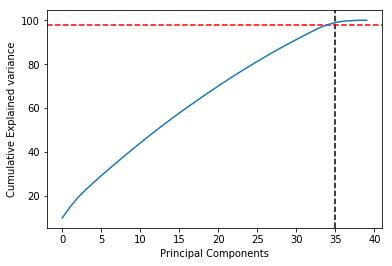

In [63]:
#plotting graph for the same
plt.ylabel('Cumulative Explained variance')
plt.xlabel('Principal Components')
plt.axvline(x=k,color='k',linestyle='--')
plt.axhline(y=98,color='r',linestyle='--')

plt.plot(var_cumu)
plt.show()

# Creating Final Dataset with 35 columns

In [64]:
FinalPCA=PCA(n_components=35)
Fdf=FinalPCA.fit_transform(df)

In [66]:
Fdf=pd.DataFrame(Fdf)
Fdf

,0,1,2,3,4,5,6,7,8,9,...,25,26,27,28,29,30,31,32,33,34
0,-1.101058e+06,-34164.271444,20717.674006,-4878.727667,39484.155486,1019.712951,4636.039308,-167.648446,520.405860,-113.640663,...,-1.631252,-2.378134,-0.798616,-0.506617,1.444965,-0.431321,-0.506264,0.023033,-0.804804,0.589611
1,3.899018e+06,-33666.294402,-62188.797106,-29077.938448,-56.002626,-901.053326,-180.618983,891.047281,142.843284,61.556731,...,0.234508,-1.242646,-0.621382,1.559492,1.094176,0.510808,-0.879148,-0.050881,0.340529,0.489067
2,3.898954e+06,-71821.330853,-25176.073785,-10962.722977,28124.522811,-2727.889620,-2674.183593,844.710614,182.042116,-163.804775,...,0.134120,-0.896903,2.424503,-1.537905,0.732465,-1.193592,0.818000,-1.069615,0.244767,-0.562742
3,4.899051e+06,102740.933478,26088.060253,41858.437593,-3712.753434,6207.142148,-365.977371,894.554493,167.536059,-123.815340,...,1.158787,-1.784440,-0.789335,-0.464365,0.791022,1.471649,0.497338,-0.238414,0.592190,-0.572882
4,4.899080e+06,107274.846262,-47486.738816,50164.213510,17452.079513,-441.476324,-435.531138,-179.095105,-280.963114,-353.548850,...,0.700456,0.051541,-1.606060,0.591389,0.404671,1.583796,-0.693826,0.963682,-0.065755,0.534263
5,-1.101016e+06,-21873.820959,10686.844268,-38878.182248,-965.097725,5920.531300,-432.628537,-19.049100,418.832096,-38.327345,...,1.478325,1.615387,1.668756,-0.730598,1.145900,-0.300993,-0.954171,-0.025274,0.343932,-0.521598
6,-1.101024e+06,-60619.551515,31472.840088,16277.353189,-50728.225742,-7646.768321,-9533.420917,-188.356967,-18.878506,-117.491072,...,-3.092716,-1.492374,1.519528,1.343089,-0.000265,0.255368,-1.139297,0.028003,1.290904,0.389935
7,-1.100928e+06,103235.710216,-6194.891540,-34789.006793,-3755.937957,-4667.839248,133.970124,-172.268018,-214.202587,107.777471,...,1.752931,-0.942516,1.765310,-0.368664,-0.788749,0.440293,1.640523,-0.805284,0.808374,0.560659
8,-1.100914e+06,102307.979800,-32850.444935,-31461.708270,-4607.020768,2463.878265,-287.150401,-558.515262,-32.550794,-163.460837,...,1.768938,-1.607096,-0.371452,0.510786,-0.442065,0.857535,0.723206,-1.004207,0.869095,-0.488993
9,-1.100913e+06,100270.646444,-10171.341838,-4590.404304,-29908.020218,3012.232963,-208.711947,-572.951462,-259.025098,-53.895764,...,2.303139,-1.492976,-0.278924,0.776867,-0.604300,0.363374,1.307468,-0.733217,-0.424659,0.399520


We can observe that now we have data with 35 columns.

# Model Building


In [68]:
#importing Libraries for buiding model
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')

In [69]:
#Code for finding best random state
dt=DecisionTreeClassifier()
for i in range(0,200):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=i)
    dt.fit(x_train,y_train)
    pred_train=dt.predict(x_train)
    pred_test=dt.predict(x_test)
    print(f'At random state {i}, the training accuracy is: {accuracy_score(y_train,pred_train)}')
    print(f'At random state {i}, the testing accuracy is: {accuracy_score(y_test,pred_test)}')
    print("\n")

At random state 0, the training accuracy is: 1.0
At random state 0, the testing accuracy is: 1.0


At random state 1, the training accuracy is: 1.0
At random state 1, the testing accuracy is: 1.0


At random state 2, the training accuracy is: 1.0
At random state 2, the testing accuracy is: 1.0


At random state 3, the training accuracy is: 1.0
At random state 3, the testing accuracy is: 1.0


At random state 4, the training accuracy is: 1.0
At random state 4, the testing accuracy is: 1.0


At random state 5, the training accuracy is: 1.0
At random state 5, the testing accuracy is: 1.0


At random state 6, the training accuracy is: 1.0
At random state 6, the testing accuracy is: 1.0


At random state 7, the training accuracy is: 1.0
At random state 7, the testing accuracy is: 1.0


At random state 8, the training accuracy is: 1.0
At random state 8, the testing accuracy is: 1.0


At random state 9, the training accuracy is: 1.0
At random state 9, the testing accuracy is: 1.0


At random 

At random state 100, the training accuracy is: 1.0
At random state 100, the testing accuracy is: 1.0


At random state 101, the training accuracy is: 1.0
At random state 101, the testing accuracy is: 1.0


At random state 102, the training accuracy is: 1.0
At random state 102, the testing accuracy is: 1.0


At random state 103, the training accuracy is: 1.0
At random state 103, the testing accuracy is: 1.0


At random state 104, the training accuracy is: 1.0
At random state 104, the testing accuracy is: 1.0


At random state 105, the training accuracy is: 1.0
At random state 105, the testing accuracy is: 1.0


At random state 106, the training accuracy is: 1.0
At random state 106, the testing accuracy is: 1.0


At random state 107, the training accuracy is: 1.0
At random state 107, the testing accuracy is: 1.0


At random state 108, the training accuracy is: 1.0
At random state 108, the testing accuracy is: 1.0


At random state 109, the training accuracy is: 1.0
At random state 109, t

As there is no difference in the accuracy score at any random state and we are attaining training & testing accuracy as 100%, we will randomly select random state as 7.

In [70]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=7)

We split our data into Training and Testing giving 80% data for Training and 20% for Testing at random state 7. We will use different algorithms for comparing accuracies and attaining the best model. We will compare Logitic Regression and DecisionTreeClassifier in this case.

In [71]:
model=[LogisticRegression(),DecisionTreeClassifier()]

In [72]:
for m in model:
    m.fit(x_train,y_train)
    m.score(x_train,y_train)
    predm=m.predict(x_test)
    print('Accuracy score of',m,'is:')
    print(accuracy_score(y_test,predm))
    print(confusion_matrix(y_test,predm))
    print(classification_report(y_test,predm))
    print('\n')

Accuracy score of LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False) is:
1.0
[[152   0]
 [  0  44]]
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       152
         1.0       1.00      1.00      1.00        44

   micro avg       1.00      1.00      1.00       196
   macro avg       1.00      1.00      1.00       196
weighted avg       1.00      1.00      1.00       196



Accuracy score of DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitte

We are getting accuracy as 100% for both Logistic Regression and DecisionTreeClassifier.

We might attain this accuracy due to Overfitting/Underfitting problems as well. Let's use different Testing Techniques to test accuracy. 

# Cross Validation of the Model


In [73]:
#Finding best cv score at a particular cv
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

from sklearn.model_selection import cross_val_score
for j in range(2,10):
    cv_score=cross_val_score(dt,x,y,cv=j)
    cv_mean=cv_score.mean()
    print(f"At cross fold {j} the cv score is {cv_mean} and r2 score for training is {train_accuracy} and accuracy for the testing is {test_accuracy}")
    print("\n")

At cross fold 2 the cv score is 1.0 and r2 score for training is 0.6364795918367347 and accuracy for the testing is 0.6479591836734694


At cross fold 3 the cv score is 1.0 and r2 score for training is 0.6364795918367347 and accuracy for the testing is 0.6479591836734694


At cross fold 4 the cv score is 1.0 and r2 score for training is 0.6364795918367347 and accuracy for the testing is 0.6479591836734694


At cross fold 5 the cv score is 1.0 and r2 score for training is 0.6364795918367347 and accuracy for the testing is 0.6479591836734694


At cross fold 6 the cv score is 1.0 and r2 score for training is 0.6364795918367347 and accuracy for the testing is 0.6479591836734694


At cross fold 7 the cv score is 1.0 and r2 score for training is 0.6364795918367347 and accuracy for the testing is 0.6479591836734694


At cross fold 8 the cv score is 1.0 and r2 score for training is 0.6364795918367347 and accuracy for the testing is 0.6479591836734694


At cross fold 9 the cv score is 1.0 and r

As there is no difference in the cv score at any cv cross fold. Hence, we will randomly select the cv at 7.

Here we have handled the problem or overfitting and underfitting by checking the training and testing score. Let's try checking if we are covering the points to attain accuracy by Visualizing it.

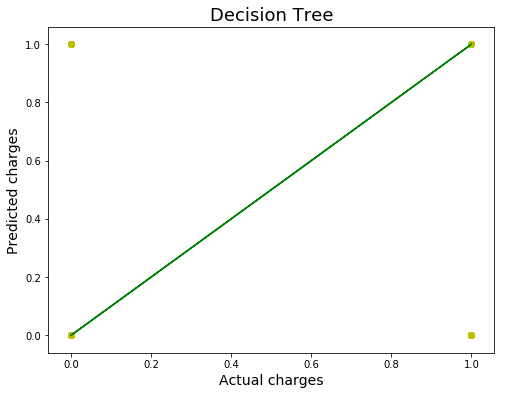

In [74]:
#Code for checking linear Regression points with target variale
import matplotlib.pyplot as plt
plt.figure(figsize=(8,6))
plt.scatter(x=y_test,y=pred_test,color='y')
plt.plot(y_test,y_test,color='g')
plt.xlabel('Actual charges',fontsize=14)
plt.ylabel('Predicted charges',fontsize=14)
plt.title('Decision Tree',fontsize=18)
plt.show()

The Best Fit line is covering both binary values (0 & 1) of our target variable which shows good fit of our model.

In [75]:
#Finding cv scores of both algorithms used for our data
for m in model:
    cv_score=cross_val_score(m,x,y,cv=j)
    cv_mean=cv_score.mean()
    print("Cross Validation score of ",m," model: ",cv_score.mean())
    print('\n')
    print('\n')

Cross Validation score of  LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)  model:  1.0




Cross Validation score of  DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')  model:  1.0






The cross Validation score for both Logistic Regression and DecisionTreeClassifier is 100%. Hence, we can select any algorithm of our choice to proceed forward. We are selecting Logistic Regression in this case.

# Hyper Parameter Tuning

In [76]:
#Importing Libarary for Hyper Parameter Tuning GridSearchCV
from sklearn.model_selection import GridSearchCV

In [77]:
#Creating parameter list to pass in GridSearchCV
parameters={'max_iter':range(1,200),'penalty':['l1','l2']}

In [78]:
GCV=GridSearchCV(LogisticRegression(),parameters,cv=7)

In [79]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=7, error_score='raise-deprecating',
       estimator=LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'max_iter': range(1, 200), 'penalty': ['l1', 'l2']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [80]:
#Printing the best parameter found by GridSearchCV
GCV.best_params_ 

{'max_iter': 1, 'penalty': 'l1'}

In [83]:
GCV_pred=GCV.best_estimator_.predict(x_test)

In [84]:
accuracy_score(y_test,GCV_pred)

1.0

After applying Hyper Parameter Tuning to our Logistic Regression, we still get accuracy score as 100%

# Saving The Model

In [85]:
from sklearn.externals import joblib
joblib.dump(GCV.best_estimator_,'insurance_fraud.pkl')

['insurance_fraud.pkl']